## 1 - Run the boiler-plate to download all required libraries

In [35]:
from PIL import Image
import requests
import io
import math
import matplotlib.pyplot as plt
from IPython import display
%config InlineBackend.figure_format = 'retina'

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
import numpy
torch.set_grad_enabled(False);

## 2 - Installing the panoptic API needed for panoptic segmentation

In [2]:
!pip install git+https://github.com/cocodataset/panopticapi.git

  Running command git clone --filter=blob:none -q https://github.com/cocodataset/panopticapi.git 'C:\Users\sams\AppData\Local\Temp\pip-req-build-8in_fel_'



  Cloning https://github.com/cocodataset/panopticapi.git to c:\users\sams\appdata\local\temp\pip-req-build-8in_fel_
  Resolved https://github.com/cocodataset/panopticapi.git to commit 7bb4655548f98f3fedc07bf37e9040a992b054b0
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for panopticapi: filename=panopticapi-0.1-py3-none-any.whl size=9401 sha256=fa26f029a4fe25c10c42690910862ac2eee5ae31c120c027b8dbc319fa891806
  Stored in directory: C:\Users\sams\AppData\Local\Temp\pip-ephem-wheel-cache-pihx__e5\wheels\4a\6b\52\6a1fee2c513be4b855fa75ec878335871c9967efb4f8ac2682
Successfully built panopticapi


In [36]:
import panopticapi
from panopticapi.utils import id2rgb, rgb2id

## 3 - Defining up required variables

In [37]:
# These are the COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# Detectron2 uses a different numbering scheme, we build a conversion table
coco2d2 = {}
count = 0
for i, c in enumerate(CLASSES):
  if c != "N/A":
    coco2d2[i] = count
    count+=1

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

## 4 - Loading a pretrained model from TorchHub

In [38]:
model, postprocessor = torch.hub.load('facebookresearch/detr', 'detr_resnet101_panoptic', pretrained=True, return_postprocessor=True, num_classes=250)
model.eval();


Using cache found in C:\Users\sams/.cache\torch\hub\facebookresearch_detr_main


## 5 - Prepare an image

Using the default image from 'images/homepage.jpg'


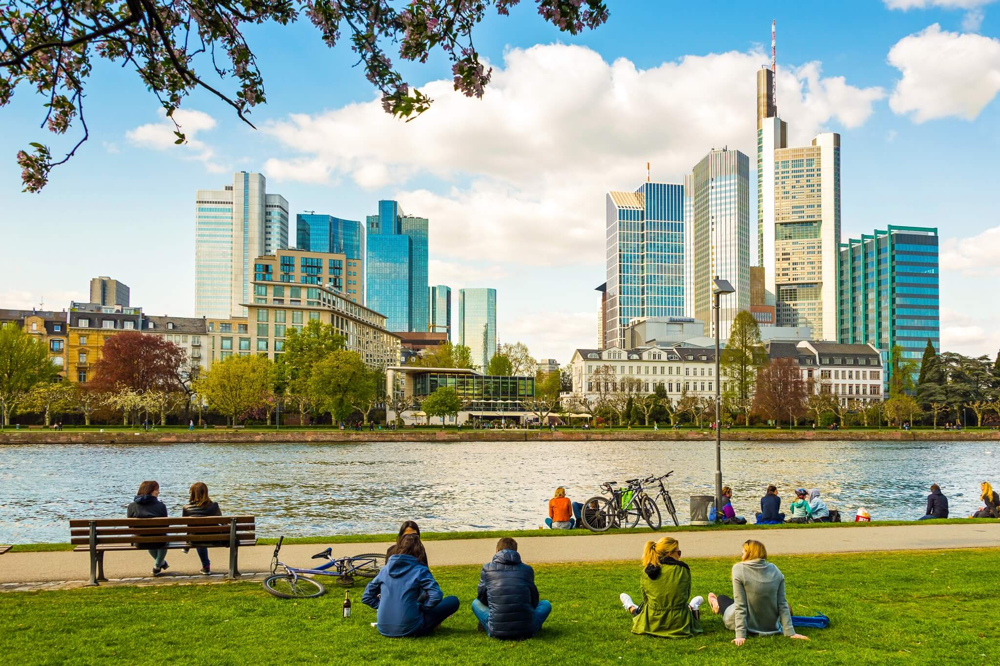

In [57]:
url = input("Give the image url or path: ")
im = None
if not url:
    print("Using the default image from 'images/homepage.jpg'")
    im = Image.open('images/homepage.jpg')
elif url[:4] == 'http':
    im = Image.open(requests.get(url, stream=True).raw)
else:
    im = Image.open(url)
display(im)

## 6 - Run the prediction

In [58]:
# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)
out = model(img) # This returns a mask for each query

C:\Users\sams/.cache\torch\hub\facebookresearch_detr_main\models\position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


## 7 - Visualizing some high confidence predicted masks

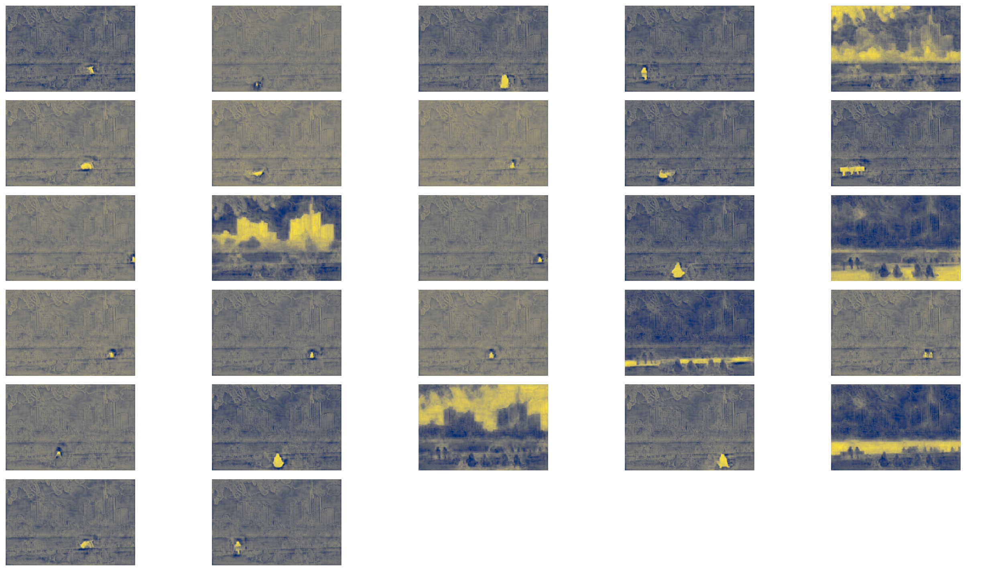

In [59]:
# compute the scores, excluding the "no-object" class (the last one)
scores = out["pred_logits"].softmax(-1)[..., :-1].max(-1)[0]
# threshold the confidence
keep = scores > 0.85

# Plot all the remaining masks
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))
for line in axs:
    for a in line:
        a.axis('off')
for i, mask in enumerate(out["pred_masks"][keep]):
    ax = axs[i // ncols, i % ncols]
    ax.imshow(mask, cmap="cividis")
    ax.axis('off')
fig.tight_layout()

## 8 - Using DETR preprocessor to merge the predicted masks into a unified panoptic mask

In [51]:
# the post-processor expects as input the target size of the predictions
# (which we set here to the image size)
result = postprocessor(out, torch.as_tensor(img.shape[-2:]).unsqueeze(0))[0]

C:\Users\sams\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


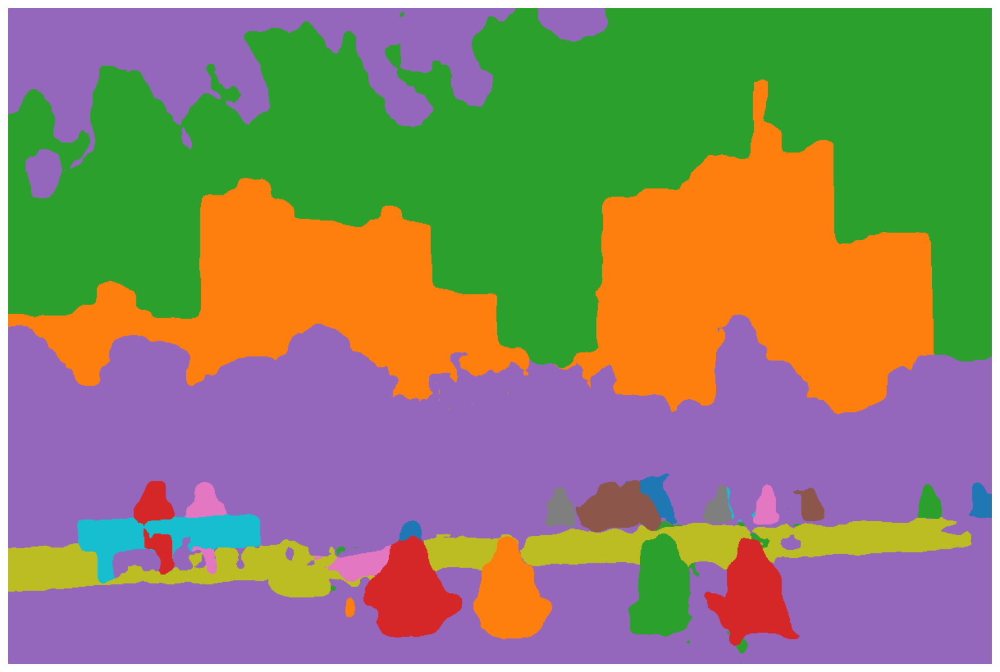

In [60]:
import itertools
import seaborn as sns
palette = itertools.cycle(sns.color_palette())

# The segmentation is stored in a special-format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8).copy()
# We retrieve the ids corresponding to each mask
panoptic_seg_id = rgb2id(panoptic_seg)

# Finally we color each mask individually
panoptic_seg[:, :, :] = 0
for id in range(panoptic_seg_id.max() + 1):
  panoptic_seg[panoptic_seg_id == id] = numpy.asarray(next(palette)) * 255
plt.figure(figsize=(15,15))
plt.imshow(panoptic_seg)
plt.axis('off')
plt.show()

## 9 - Installing and using Detectron2 for printing beautiful predictions images

In [56]:
!python -m pip install git+https://github.com/facebookresearch/detectron2.git

  Cloning https://github.com/facebookresearch/detectron2.git to c:\users\sams\appdata\local\temp\pip-req-build-tu_go3ce
  Resolved https://github.com/facebookresearch/detectron2.git to commit 08f617cc2c9276a48e7e7dc96ae946a5df23af3f
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


  Running command git clone --filter=blob:none -q https://github.com/facebookresearch/detectron2.git 'C:\Users\sams\AppData\Local\Temp\pip-req-build-tu_go3ce'


In [44]:
from detectron2.config import get_cfg
import detectron2 as d2
import cv2

from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

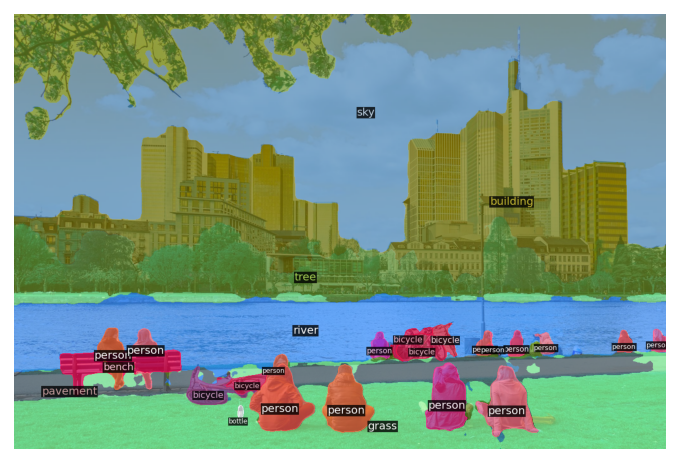

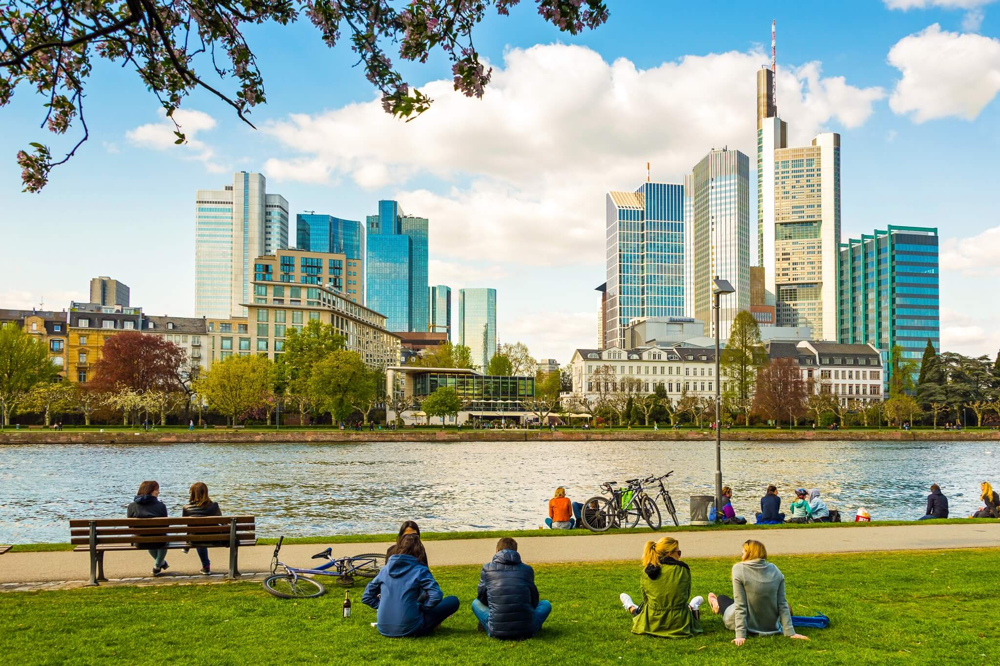

In [61]:
from copy import deepcopy
# We extract the segments info and the panoptic result from DETR's prediction
segments_info = deepcopy(result["segments_info"])
# Panoptic predictions are stored in a special format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
final_w, final_h = panoptic_seg.size
# We convert the png into an segment id map
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8)
panoptic_seg = torch.from_numpy(rgb2id(panoptic_seg))


# Detectron2 uses a different numbering of coco classes, here we convert the class ids accordingly
meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info)):
    c = segments_info[i]["category_id"]
    segments_info[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]


# Finally we visualize the prediction
v = Visualizer(numpy.array(im.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg, segments_info, area_threshold=0)
pan_img = v.get_image()
plt.imshow(pan_img)
plt.axis(False)
plt.show()
im